<a href="https://colab.research.google.com/github/fritzfrancisco/TrackUtils/blob/main/keypoint_detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and play with it yourself. __DO NOT__ request access to this tutorial.



# Install detectron2

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 21 kB/s 
     |████████████████████████████████| 6.6 MB 12.8 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0+cu113
    Uninstalling torch-1.11.0+cu113:
      Successfully uninstalled torch-1.11.0+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0+cu113
    Uninstalling torchvision-0.12.0+cu113:
      Successfully uninstalled torchvision-0.12.0+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.12.0 requires torch==1.11.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.11.0+cu113 requires torch==1.11.0, but you have torch 1.5.0+cu101

In [1]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [2]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import os, sys
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Train on a custom dataset

## Prepare the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [9]:
# DatasetCatalog.clear()

In [3]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances


NameOfCOCODataset = "/content/gdrive/My Drive/pufferDetectron2.json"
ImageDirectory = "/content/gdrive/My Drive/testingDetectron2KeyPointImages/"
DatasetName = "puffer"

## Register Custom Dataset locally
register_coco_instances(DatasetName, {}, NameOfCOCODataset,ImageDirectory)

custom_metadata = MetadataCatalog.get(DatasetName)
## List Dataset Catalog
#DatasetCatalog.list()

## Clear Dataset Catalog
#DatasetCatalog.clear()

In [4]:
custom_metadata

Metadata(evaluator_type='coco', image_root='/content/gdrive/My Drive/testingDetectron2KeyPointImages/', json_file='/content/gdrive/My Drive/pufferDetectron2.json', name='puffer')

In [5]:
DatasetCatalog.list()
# TestCOCODataset = ""
# TestImageDirectory = ""
# ValidataionCOCODataset = ""
# ValidationImageDirectory = ""
# register_coco_instances("custom_test", {}, TestCOCODataset, TestImageDirectory)
# register_coco_instances("custom_val", {}, ValidataionCOCODataset, ValidationImageDirectory)

['coco_2014_train',
 'coco_2014_val',
 'coco_2014_minival',
 'coco_2014_minival_100',
 'coco_2014_valminusminival',
 'coco_2017_train',
 'coco_2017_val',
 'coco_2017_test',
 'coco_2017_test-dev',
 'coco_2017_val_100',
 'keypoints_coco_2014_train',
 'keypoints_coco_2014_val',
 'keypoints_coco_2014_minival',
 'keypoints_coco_2014_valminusminival',
 'keypoints_coco_2014_minival_100',
 'keypoints_coco_2017_train',
 'keypoints_coco_2017_val',
 'keypoints_coco_2017_val_100',
 'coco_2017_train_panoptic_separated',
 'coco_2017_train_panoptic_stuffonly',
 'coco_2017_val_panoptic_separated',
 'coco_2017_val_panoptic_stuffonly',
 'coco_2017_val_100_panoptic_separated',
 'coco_2017_val_100_panoptic_stuffonly',
 'lvis_v0.5_train',
 'lvis_v0.5_val',
 'lvis_v0.5_val_rand_100',
 'lvis_v0.5_test',
 'lvis_v0.5_train_cocofied',
 'lvis_v0.5_val_cocofied',
 'cityscapes_fine_instance_seg_train',
 'cityscapes_fine_sem_seg_train',
 'cityscapes_fine_instance_seg_val',
 'cityscapes_fine_sem_seg_val',
 'cityscap

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



[06/23 22:14:43 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/gdrive/My Drive/pufferDetectron2.json


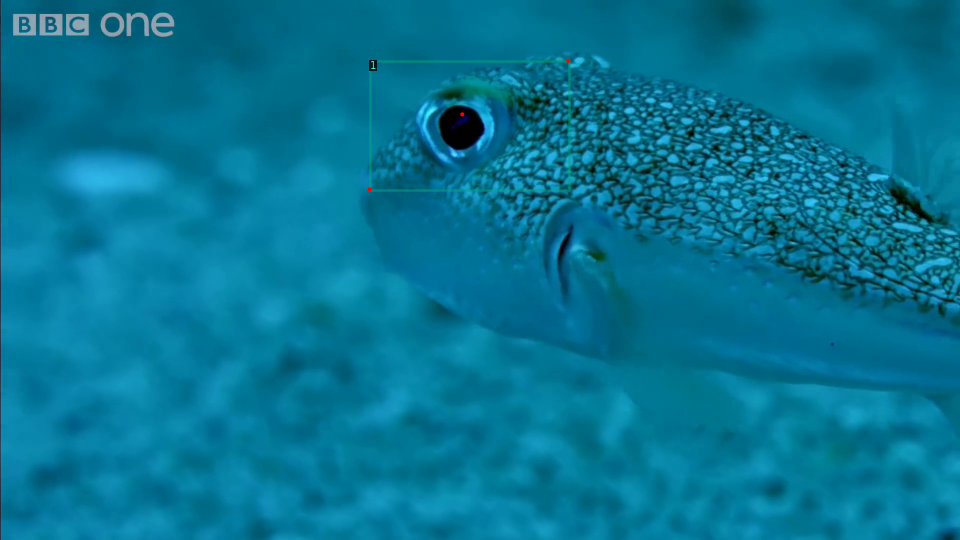

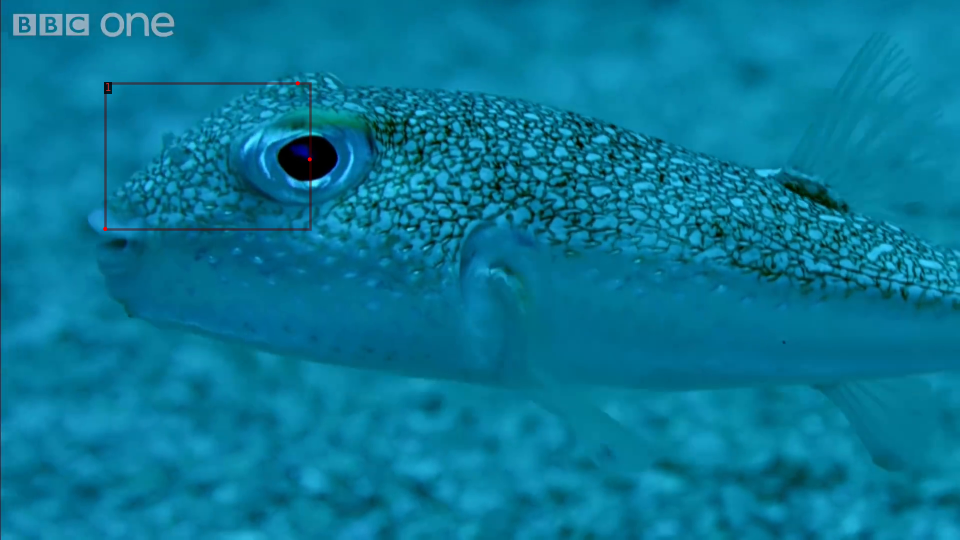

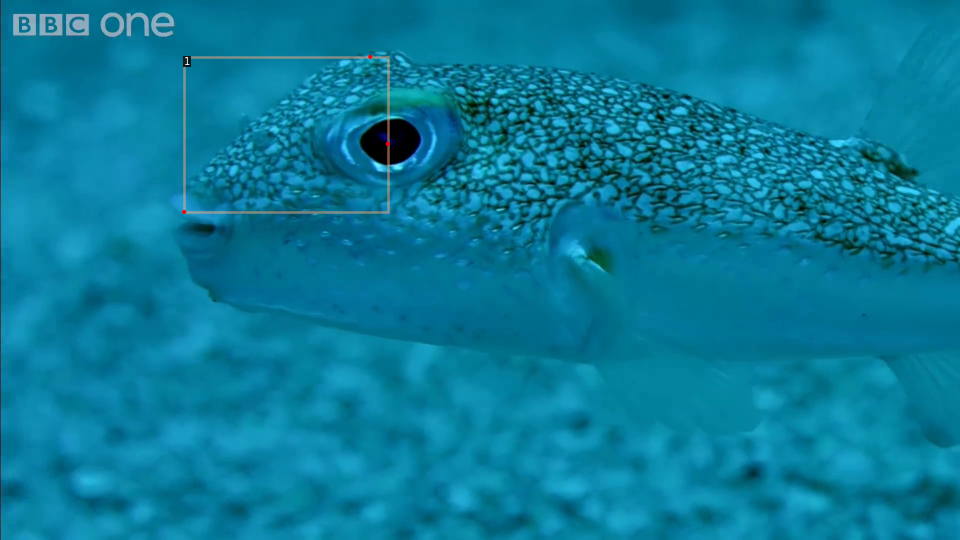

In [6]:
# dataset_dicts = get_balloon_dicts("balloon/train")
dataset_dicts = detectron2.data.datasets.load_coco_json(NameOfCOCODataset,ImageDirectory)
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    # visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    visualizer = Visualizer(img[:, :, ::-1], metadata=custom_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU, or ~2 minutes on a P100 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = (DatasetName,)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.WARMUP_ITERS = 500
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # IMPORTANT: Change to the correct number of clases in your custom Dataset
cfg.MODEL.RETINANET.NUM_CLASSES = 1  # IMPORTANT: Change to the correct number of clases in your custom Dataset

# add metadata 
keypoint_names = ["left_eye", "right_eye", "mouth", "tail"]
keypoint_flip_map = [("left_eye", "right_eye"), ("left_eye", "mouth"), ("right_eye", "mouth"), ("mouth", "tail")]
classes = MetadataCatalog.get(DatasetName).thing_classes = ["fish"]
MetadataCatalog.get(DatasetName).thing_dataset_id_to_contiguous_id = {1:0} # IMPORTANT: Change if using multiple classes
MetadataCatalog.get(DatasetName).keypoint_names = keypoint_names
MetadataCatalog.get(DatasetName).keypoint_flip_map = keypoint_flip_map

cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = len(keypoint_names)
cfg.TEST.KEYPOINT_OKS_SIGMAS = np.ones((len(keypoint_names),1),dtype=float).tolist()

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/23 23:24:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.keypoint_head.score_lowres.weight' to the model due to incompatible shapes: (512, 17, 4, 4) in the checkpoint but (512, 4, 4, 4) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.keypoint_head.score_lowres.bias' to the model due to incompatible shapes: (17,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.keypoint_head.score_lowres.{bias, weight}


[06/23 23:24:55 d2.engine.train_loop]: Starting training from iteration 0
[06/23 23:25:26 d2.utils.events]:  eta: 0:07:30  iter: 19  total_loss: 8.023  loss_cls: 0.143  loss_box_reg: 0.058  loss_keypoint: 7.704  loss_rpn_cls: 0.075  loss_rpn_loc: 0.029  time: 1.5777  data_time: 0.0229  lr: 0.000010  max_mem: 12659M
[06/23 23:25:58 d2.utils.events]:  eta: 0:06:55  iter: 39  total_loss: 7.890  loss_cls: 0.114  loss_box_reg: 0.045  loss_keypoint: 7.596  loss_rpn_cls: 0.072  loss_rpn_loc: 0.023  time: 1.5801  data_time: 0.0075  lr: 0.000020  max_mem: 12659M
[06/23 23:26:29 d2.utils.events]:  eta: 0:06:22  iter: 59  total_loss: 7.602  loss_cls: 0.162  loss_box_reg: 0.074  loss_keypoint: 7.332  loss_rpn_cls: 0.051  loss_rpn_loc: 0.022  time: 1.5661  data_time: 0.0066  lr: 0.000030  max_mem: 12659M
[06/23 23:27:00 d2.utils.events]:  eta: 0:05:51  iter: 79  total_loss: 7.026  loss_cls: 0.155  loss_box_reg: 0.088  loss_keypoint: 6.746  loss_rpn_cls: 0.020  loss_rpn_loc: 0.017  time: 1.5730  dat

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

In [12]:
ls output

events.out.tfevents.1656022922.3dea29bdc9de.863.0  last_checkpoint
events.out.tfevents.1656023106.3dea29bdc9de.863.1  metrics.json
events.out.tfevents.1656023200.3dea29bdc9de.863.2  model_final.pth
events.out.tfevents.1656023292.3dea29bdc9de.863.3


## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [13]:
# load default predictor
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.DATASETS.TEST = (DatasetName, ) # set to specific dataset
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

[06/23 23:21:25 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/gdrive/My Drive/pufferDetectron2.json


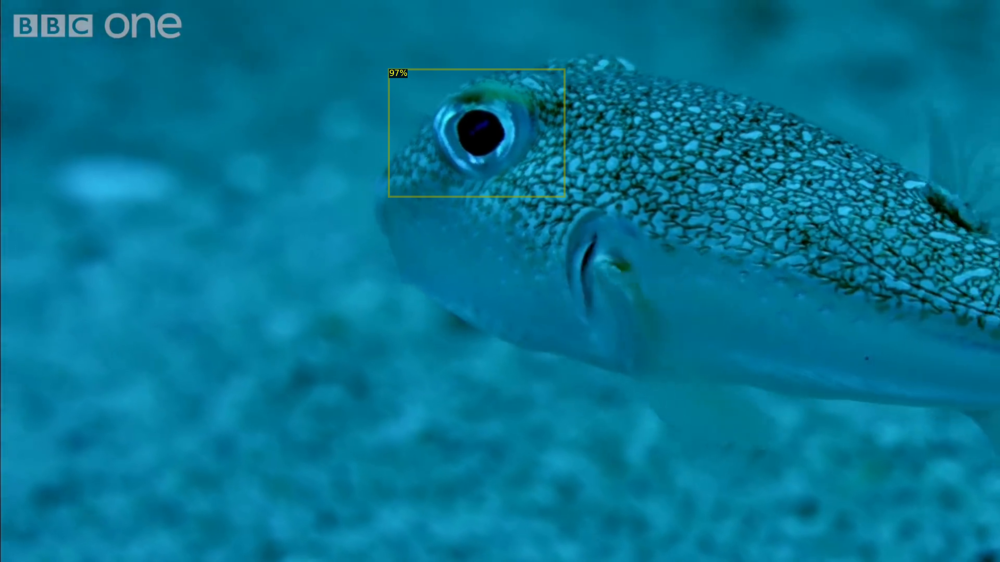

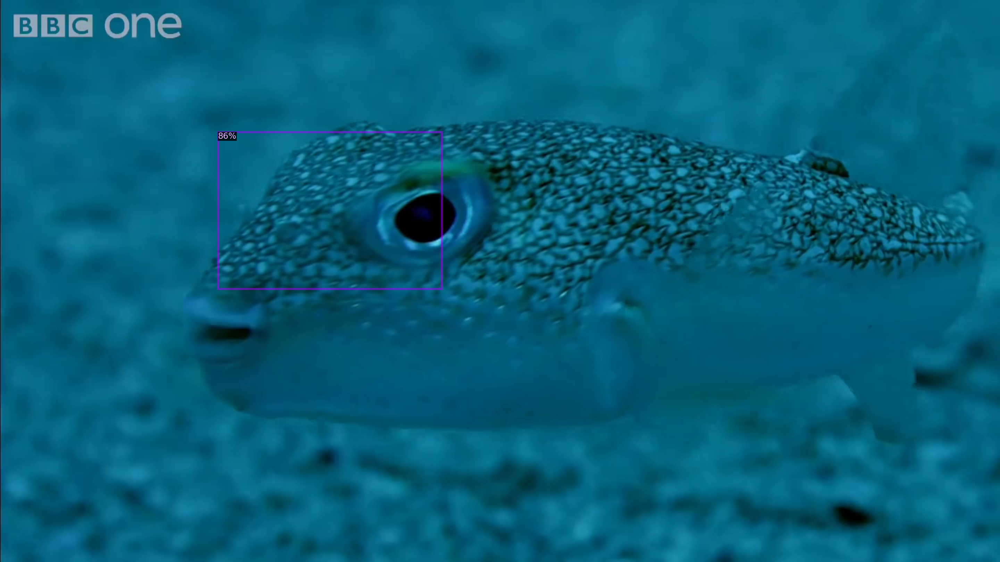

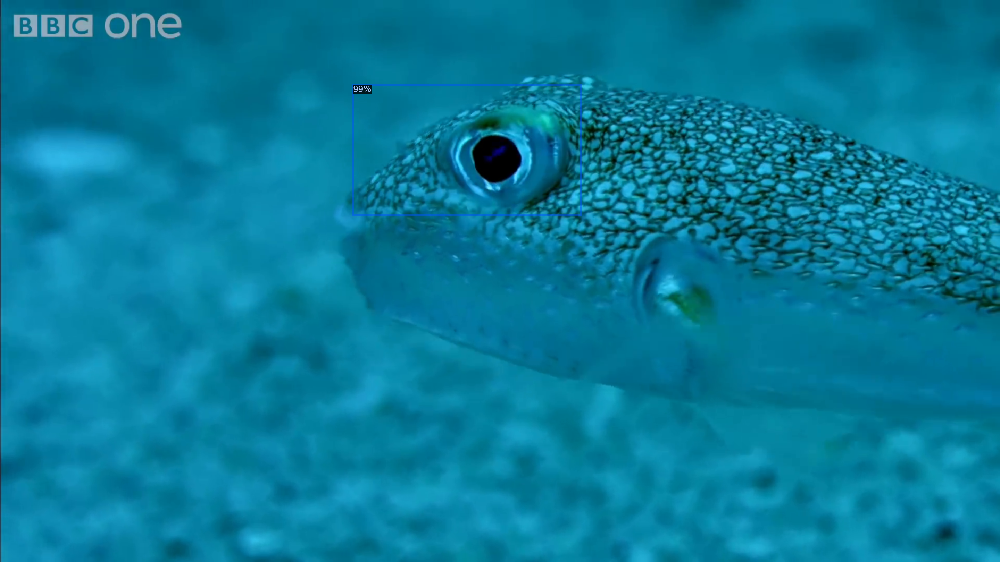

In [40]:
from detectron2.utils.visualizer import ColorMode
#dataset_dicts = get_balloon_dicts("balloon/val")
dataset_dicts = detectron2.data.datasets.load_coco_json(NameOfCOCODataset,ImageDirectory)
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    # idxofClass = [i  for i, x in enumerate(list(outputs['instances'].pred_classes)) if x == 0]
    # classes = outputs['instances'].pred_classes[idxofClass]
    # boxes = outputs['instances'].pred_boxes[idxofClass]
    # scores = outputs['instances'].scores[idxofClass]
    # obj = detectron2.structures.Instances(image_size=(480,640))
    # obj.set('pred_classes', classes)
    # obj.set('scores', scores)
    # obj.set('pred_boxes', boxes)

    # v = Visualizer(im[:, :, ::-1],
    #                metadata=custom_metadata, 
    #                scale=0.8, 
    #                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    # )

    v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TEST[0]), scale=1.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    # out = v.draw_and_connect_keypoints(outputs['instances'].pred_keypoints)
    # v.draw_instance_predictions(obj.to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70%. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator(DatasetName, cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, DatasetName)

## Load model before executing the following
#trainer = DefaultTrainer(cfg) 
#trainer.resume_or_load(resume=False)

## Inference
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

## Create Video from Custom Predictions

In [ ]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!pip uninstall -y opencv-python opencv-contrib-python
!apt install python3-opencv  # the one pre-installed have some issues
# !youtube-dl https://www.youtube.com/watch?v=ll8TgCZ0plk -f 22 -o video.mp4
# !ffmpeg -i video.mp4 -t 00:00:06 -c:v copy video-clip.mp4

     |████████████████████████████████| 1.8MB 2.7MB/s 
Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30
Uninstalling opencv-contrib-python-4.1.2.30:
  Successfully uninstalled opencv-contrib-python-4.1.2.30
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  python3-opencv
0 upgraded, 1 newly installed, 0 to remove and 59 not upgraded.
Need to get 534 kB of archives.
After this operation, 2,941 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 python3-opencv amd64 3.2.0+dfsg-4ubuntu0.1 [534 kB]
Fetched 534 kB in 1s (792 kB/s)
Selecting previously unselected package python3-opencv.
(Reading database ... 144328 files and directories currently installed.)
Preparing to 

In [ ]:
## Run frame-by-frame inference on own video using custom model
!python detectron2/demo/demo.py --config-file detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml \
                                --video-input /content/gdrive/My\ Drive/guppy_short_2040x2046.avi \
                                --confidence-threshold 0.8 --output video-output.mkv \
                                --opts MODEL.WEIGHTS output/model_final.pth

python3: can't open file 'detectron2/demo/demo.py': [Errno 2] No such file or directory


In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>